# Landmark Display

In [ ]:
!pip install "sign_language_translator[all]"

In [1]:
import os
import re
from functools import partial
from importlib import reload

import matplotlib.pyplot as plt
import numpy as np
import torch
from IPython.display import HTML, display

import sign_language_translator as slt
from sign_language_translator.vision.landmarks import connections
from sign_language_translator.vision.landmarks import display as disply
from sign_language_translator.vision.landmarks import landmarks as lndmrks

_ = reload(connections), reload(disply), reload(lndmrks), reload(slt)
# I0000 00:00:1713541007.407274       1 gl_context.cc:344] GL version: 2.1 (2.1 ATI-5.5.17), renderer: AMD Radeon Pro 555X OpenGL Engine

# slt.utils.Archive.extract("pk-hfad-1.landmarks-mediapipe-pose-2-hand-1-csv.zip", "pk-hfad-1_[a-z][a-z][a-z].*", output_dir="temp/old")

# embedding_model = slt.models.MediaPipeLandmarksModel()
# slt.Assets.get_ids(r"videos/pk-[a-z]+-\d+_[a-z]+\.mp4")[:1]

In [2]:
# land = slt.Landmarks.load_asset("xx-shapes-1_rectangle.landmarks-testmodel.csv")
land = slt.Landmarks.load_asset("pk-hfad-1_owl.landmarks-mediapipe-world.csv")
array = land.numpy().copy()

# array = np.loadtxt("temp/old/pk-hfad-1_owl.landmarks-mediapipe-pose-2-hand-1.csv", delimiter=",")
# array = array[:, :375].reshape(-1, 75, 5)

# v = slt.Video.load_asset("videos/pk-hfad-1_chicken-meat.mp4")
# embedding = model.embedding_model(v, landmark_type="all").numpy()
# array = embedding[:, :375].reshape(-1, 75, 5).copy()

# m = slt.get_model(slt.ModelCodes.LOOKUP_UR_FASTTEXT_CC.value)
# array = np.concatenate([m.embed(a).numpy().reshape(1,100,3) for a in ["a"]+m.similar(m["a"], 100)[0]])

array.shape, array.min(axis=(0,1)), array.max(axis=(0,1)), array.ptp((0,1))

((62, 75, 5),
 array([-0.2685, -0.7375, -0.3603,  0.    ,  0.    ]),
 array([0.3229, 0.794 , 0.1953, 0.9998, 1.    ]),
 array([0.5914, 1.5315, 0.5556, 0.9998, 1.    ]))

In [3]:
land.data[:, 33:     ] *= 3
land.data[:, 33:54, 0] += 0.25
land.data[:, 54:  , 0] -= 0.25
# array[:, 33:  , 1] += 0.2
# array[:, 33:  , 2] -= 0.1

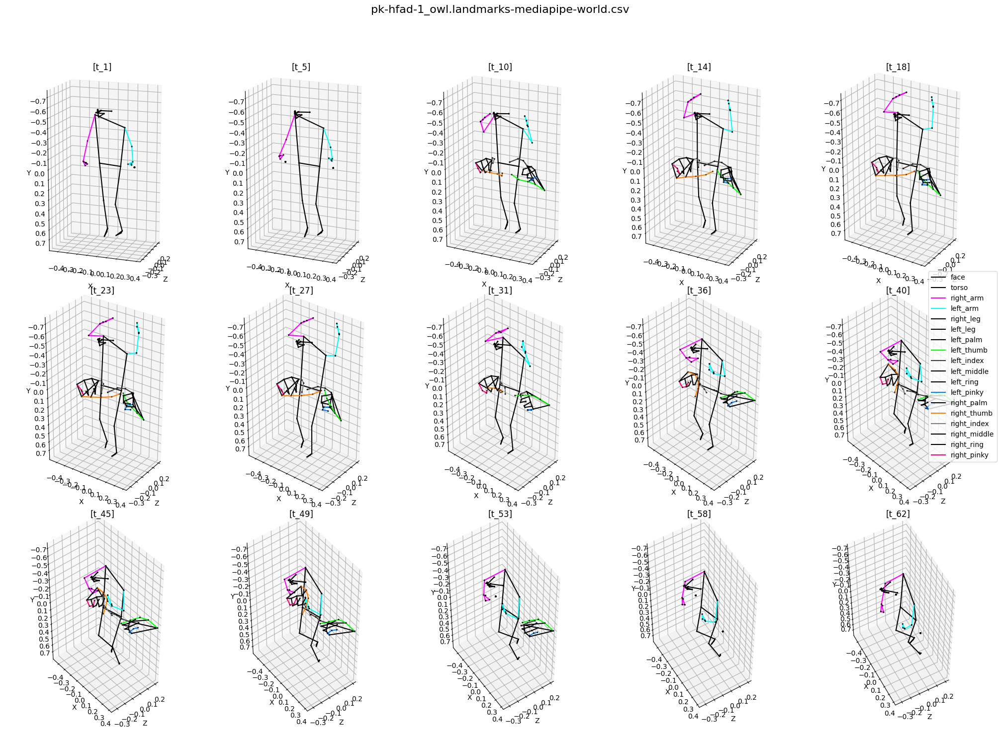

In [5]:
land.show_frames_grid(azimuth_delta=3, elevation_delta=3)
# land.save_frames_grid("grid.jpg")

In [5]:
# land.connections = "mediapipe-world"
# land._animation = None
land.show(azimuth_delta = 4, style="dark_background", title="Owl\n{frame_number}")
# land.show()

In [8]:
land.save_animation("ani.mp4")

### manual plot

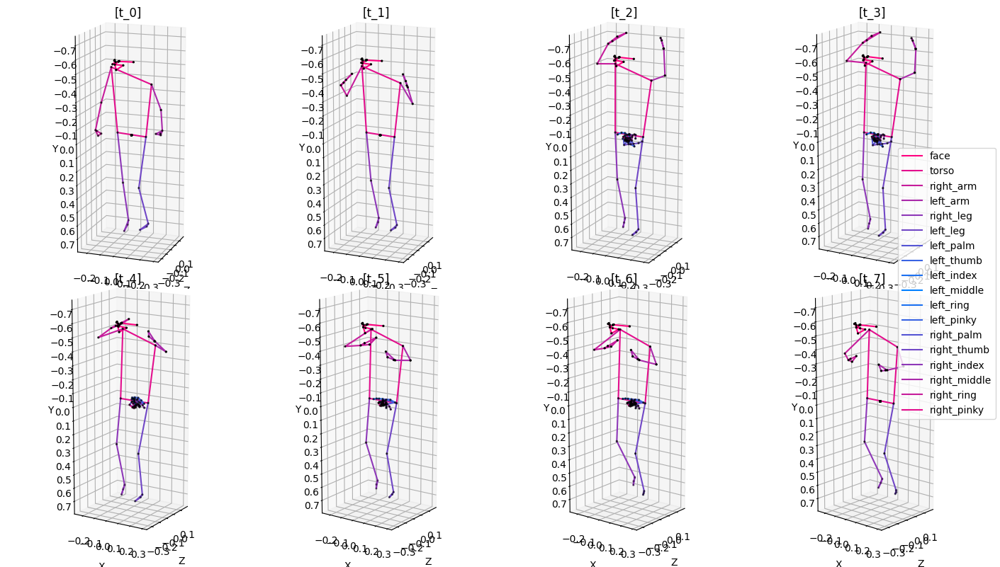

In [10]:
mpc = connections.MediapipeConnections()

fig = disply.MatPlot3D.frames_grid(
    array[0::8],
    connections=mpc.line_indexes,
    # line_colors=[tuple(v/255 for v in c) for c in mpc.line_colors],
    line_labels=mpc.line_labels,
    invert_y=True,
    invert_z=True,
    vertical_axis="y",
    subplots=(2,4),
    figure_scale=3.5,
    # title="frame ({frame_number})",
    # style="dark_background",
    # azimuth=0,
    azimuth_delta=3,
)
# fig.legend(mpc.line_labels, loc="upper left", bbox_to_anchor=(1, 1))
plt.show()
plt.close(fig)

In [16]:
conn = connections.MediapipeConnections()
animation = disply.MatPlot3D.animate(
    slt.Landmarks.load_asset("xx-shapes-1_diamond.landmarks-testmodel.csv"),
    # connections=conn.line_indexes,
    # line_colors=conn.line_colors,
    # line_labels=[conn.connection_to_label.get(c, None) for c in conn.connections],
    # invert_y=True,
    # invert_z=True,
    # vertical_axis="y",
    # figure_scale=6,
    # azimuth=20,
    # elevation=0
    # roll=0,
    azimuth_delta=1,
    # style="dark_background",
    interval=100,
)
plt.close()
html = animation.to_jshtml()
display(HTML(html))
# animation._fig

## Custom Pose Model
- (Image + hands + [memory cell]) Encoder  + Pose Decoder
- re-crop hands based on previous frame's output
- Video -> encode a frame, cross attention to previous poses
- ViT -> cross attention to previous frame encoding cache/batch with reverse positional encoding (for each layer)
- ViT LSTM / 1 memory cell

## plotly

In [6]:
import plotly.graph_objects as go
import numpy as np

landmarks = slt.Landmarks.load_asset("pk-hfad-1_car.landmarks-mediapipe-world.csv").data
landmarks[:, 33:     ] *= 3
landmarks[:, 33:54, 0] += 0.25
landmarks[:, 54:  , 0] -= 0.25
landmarks[:, 33:  , 1] += 0.2
landmarks[:, 33:  , 2] -= 0.1

landmark_texts = np.array([f"l_{j}" for j in range(75)])

LIP = [0,1,2,3,7,9,10,8,6,5,4,0,11,13,15,17,19,15,21,15,13,11,23,25,27,31,29,27,25,23,24,26,28,32,30,28,26,24,12,14,16,18,20,16,22,16,14,12,11,12,0]
hand = np.array([0,1,2,3,4,3,2,1,0,5,6,7,8,7,6,5,9,10,11,12,11,10,9,13,14,15,16,15,14,13,17,18,19,20,19,18,17,0])
LIP = LIP + (hand+33).tolist() + (hand+33+21).tolist()


frames = [
    go.Scatter3d(
        x=landmarks[i, LIP, 0], y=landmarks[i, LIP, 1], z=(z:=landmarks[i, LIP, 2]),
        mode="lines+markers",
        text=landmark_texts[LIP],
        marker=go.scatter3d.Marker(size=4, color=z, colorscale="Earth")
    )
    for i in range(len(landmarks))
]
def frame_args(duration):
    return {
        "frame": {"duration": duration},
        "mode": "immediate",
        "fromcurrent": True,
        "transition": {"duration": duration, "easing": "linear"},
    }

fig = go.Figure(frames = [go.Frame(data=[f], name=str(i)) for i, f in enumerate(frames)])
fig.add_trace(frames[0])
slider = [
        {
            "pad": {"b": 10, "t": 60},
            "len": 0.9,
            "x": 0.1,
            "y": 0,
            "currentvalue": {
                # "font": {"size": 20},
                "prefix": "Frame: ",
                "visible": True,
                "xanchor": "right"
            },
            "steps": [
                {
                    "args": [[f.name], frame_args(0)],
                    "label": str(k),
                    "method": "animate",
                }
                for k, f in enumerate(fig.frames)
            ],
        }
    ]


limits = np.stack([landmarks.min(axis=(0, 1))[:3], landmarks.max(axis=(0, 1))[:3]]).T

fig.update_layout(
    title='Landmark Asset',
    # width=600,
    height=700,
    scene=dict(
        xaxis=dict(range=limits[0], autorange=False),
        yaxis=dict(range=limits[1], autorange=False),
        zaxis=dict(range=limits[2], autorange=False),
        aspectratio=dict(x=limits[0].ptp(), y=limits[1].ptp(), z=limits[2].ptp()),
    ),
    updatemenus = [
    {
        "buttons": [
            {
                "args": [None, frame_args(30)],
                "label": "&#9654; Play", # play symbol
                "method": "animate",
            },
            {
                "args": [[None], frame_args(0)],
                "label": "&#9724; Pause", # pause symbol
                "method": "animate",
            },
        ],
        "direction": "left",
        "pad": {"r": 10, "t": 70},
        "type": "buttons",
        "x": 0.1,
        "y": 0,
    }
    ],
    sliders=slider,
    scene_camera = dict(
        up=dict(x=0, y=-1, z=0),
        # center=dict(x=0, y=0, z=0),
        eye=dict(x=0.6, y=-0.8, z=-1.6)  # norm = camera_distance
    ),
)
fig.show()

## open3d